In [1]:
import pandas as pd
from arch import arch_model
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import pygraphviz
import os
from tqdm import tqdm
import random

In [2]:
os.environ['PATH'] += ':/opt/homebrew/bin'

In [3]:
# Set seed for Python's built-in random module
random.seed(42)

# Set seed for NumPy
np.random.seed(42)

### Data read in

In [4]:
df = pd.read_csv("EUA_log_return_output.csv")

In [5]:
df["Date"] = pd.to_datetime(df["Date"])
df.set_index("Date", inplace=True)

In [6]:
df

,MO1 Comdty - Last Price,CO1 Comdty - Last Price,XA1 Comdty - Last Price,NG1 COMB Comdty - Last Price,SPX Index - Last Price,SXXP Index - Last Price,MXEU0EN Index - Last Price,SPGTCED Index - Last Price,CAC Index - Last Price,DAX Index - Last Price,VIX Index - Last Price,EURUSD Curncy - Last Price,EURGBP Curncy - Last Price,EURCHF Curncy - Last Price,EURCNY Curncy - Last Price,EURRUB Curncy - Last Price,ECO Index - Last Price,LP01TREU Index - Last Price,XAU Curncy - Last Price,LBEATREU Index - Last Price
Date,,,,,,,,,,,,,,,,,,,,
2013-01-03,-0.026922,-0.002938,-0.012339,-0.010885,-0.002088,0.005243,0.010662,0.014983,-0.003423,-0.002876,-0.008208,-0.010444,-0.001283,-0.000818,-0.010151,-0.006652,0.034590,0.004678,-0.013668,-0.001431
2013-01-04,-0.009677,-0.007429,-0.001129,0.027450,0.004853,0.003480,0.006640,0.011045,0.002375,0.002566,-0.051438,0.001532,0.003659,-0.000819,-0.009787,0.002280,0.004159,0.001315,-0.004753,-0.002003
2013-01-07,0.050564,0.000808,-0.013080,-0.006409,-0.003128,-0.004178,-0.009364,-0.006575,-0.006828,-0.005637,-0.002896,0.003666,0.001008,0.000008,-0.000049,0.003151,-0.023203,0.003139,-0.005559,0.000749
2013-01-08,-0.029713,0.004836,-0.007469,-0.014806,-0.003248,-0.001327,-0.001842,-0.010589,0.000335,-0.004774,-0.012404,-0.002748,0.001105,0.000372,0.005690,-0.003923,-0.001342,0.002827,0.007386,0.001822
2013-01-09,-0.040491,-0.001609,0.000000,-0.033173,0.002652,0.006859,0.008433,0.015040,0.003117,0.003197,0.013854,-0.001300,0.000638,0.000066,-0.001779,0.001410,0.017531,0.001984,-0.000904,0.000608
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-27,-0.029190,-0.018255,0.004133,-0.085500,-0.014688,-0.000717,-0.007822,-0.004684,-0.002658,-0.005284,0.186801,-0.000476,-0.001429,-0.004997,0.000171,-0.004517,-0.043677,0.000000,0.000000,0.001849
2025-01-28,0.011524,0.005305,0.010486,-0.063079,0.009176,0.003599,0.001928,-0.006926,-0.001166,0.006949,-0.086910,-0.005927,-0.001383,-0.003366,-0.015427,0.000339,-0.013014,0.000000,0.000000,-0.000592
2025-01-29,0.032934,-0.011813,-0.002725,0.018271,-0.004690,0.004991,0.002521,0.015562,-0.003157,0.009610,0.009099,-0.000863,-0.001564,0.001981,-0.001337,0.011790,0.002222,0.000000,0.000000,-0.000454


### Arch-Garch Modelling EUA

In [7]:
log_returns_scaled = df * 1000

In [8]:
from statsmodels.nonparametric.smoothers_lowess import lowess

In [9]:
abs_log_return = np.abs(log_returns_scaled["MO1 Comdty - Last Price"])
abs_log_returns_values = abs_log_return.values.ravel()
loess_smoothed = lowess(abs_log_returns_values, np.arange(len(abs_log_returns_values)), frac=0.05)

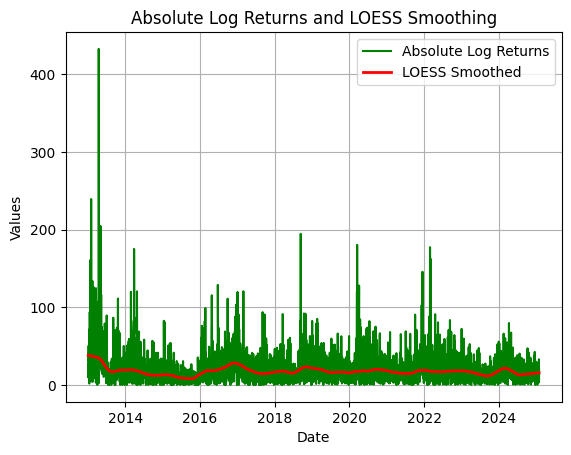

In [10]:
plt.plot(abs_log_return.index, abs_log_returns_values, color='green', label="Absolute Log Returns")
plt.plot(abs_log_return.index, loess_smoothed[:, 1], color='red', label="LOESS Smoothed", linewidth=2)
plt.title("Absolute Log Returns and LOESS Smoothing")
plt.xlabel("Date")
plt.ylabel("Values")
plt.grid()
plt.legend()
plt.show()

In [11]:
X = log_returns_scaled.drop(["MO1 Comdty - Last Price"], axis=1)
y = log_returns_scaled["MO1 Comdty - Last Price"]

#### First Model

In [12]:
first_t_model = arch_model(y=y, mean='ARX', lags=1, vol='Garch', p=1, q=1, dist='t', x=X)
first_t_result = first_t_model.fit(disp='off')

print(first_t_result.summary())

                             AR-X - GARCH Model Results                             
Dep. Variable:      MO1 Comdty - Last Price   R-squared:                       0.054
Mean Model:                            AR-X   Adj. R-squared:                  0.048
Vol Model:                            GARCH   Log-Likelihood:               -14476.9
Distribution:      Standardized Student's t   AIC:                           29003.8
Method:                  Maximum Likelihood   BIC:                           29154.9
                                              No. Observations:                 3118
Date:                      Mon, Mar 24 2025   Df Residuals:                     3097
Time:                              22:06:13   Df Model:                           21
                                            Mean Model                                           
                                    coef    std err          t      P>|t|        95.0% Conf. Int.
---------------------------------------

#### Auto BIC param finder

In [13]:
bic_table = pd.DataFrame(columns=["Lags", "p", "q", "BIC"])

for lag in tqdm(range(8)):
    for p in range(1, 10):
        for q in range(1, 10):
            garch_t_model = arch_model(y=y, mean='ARX', lags=lag, vol='Garch', p=p, q=q, dist='t', x=X)
            garch_t_result = garch_t_model.fit(disp='off')

            given_bic = garch_t_result.bic

            bic_table = pd.concat([bic_table, pd.DataFrame([{"Lags": lag, "p": p, "q": q, "BIC": given_bic}])], ignore_index=True)

bic_table

  0%|          | 0/8 [00:00<?, ?it/s]/var/folders/mq/fwlcfkh5473f1v14fcsfsgq80000gn/T/ipykernel_30092/505086039.py:11: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  bic_table = pd.concat([bic_table, pd.DataFrame([{"Lags": lag, "p": p, "q": q, "BIC": given_bic}])], ignore_index=True)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/arch/univariate/base.py:768: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/arch/univariate/base.py:768: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached


,Lags,p,q,BIC
0,0,1,1,29165.943948
1,0,1,2,29173.977970
2,0,1,3,29181.942071
3,0,1,4,29189.690396
4,0,1,5,29197.611575
...,...,...,...,...
643,7,9,5,29217.275172
644,7,9,6,29223.725483
645,7,9,7,29231.738853
646,7,9,8,29239.781873


In [14]:
bic_table.sort_values(by="BIC", ascending=True)

,Lags,p,q,BIC
567,7,1,1,29125.621055
486,6,1,1,29129.095595
576,7,2,1,29133.663145
568,7,1,2,29133.664076
405,5,1,1,29133.943307
...,...,...,...,...
242,2,9,9,29274.917921
161,1,9,9,29277.452613
71,0,8,9,29279.816235
79,0,9,8,29280.439561


#### Best model

In [15]:
best_t_model = arch_model(y=y, mean='ARX', lags=7, vol='Garch', p=1, q=1, dist='t', x=X)
best_t_result = best_t_model.fit(disp='off')

print(best_t_result.summary())

                             AR-X - GARCH Model Results                             
Dep. Variable:      MO1 Comdty - Last Price   R-squared:                       0.057
Mean Model:                            AR-X   Adj. R-squared:                  0.050
Vol Model:                            GARCH   Log-Likelihood:               -14438.1
Distribution:      Standardized Student's t   AIC:                           28938.3
Method:                  Maximum Likelihood   BIC:                           29125.6
                                              No. Observations:                 3112
Date:                      Mon, Mar 24 2025   Df Residuals:                     3085
Time:                              22:09:56   Df Model:                           27
                                            Mean Model                                           
                                    coef    std err          t      P>|t|        95.0% Conf. Int.
---------------------------------------

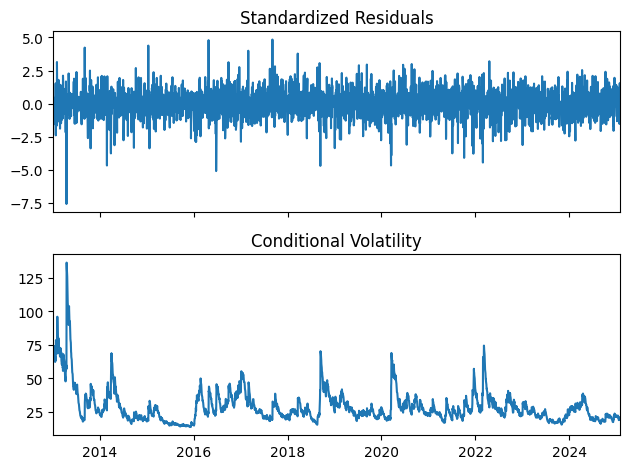

In [16]:
fig = best_t_result.plot()
plt.tight_layout()
plt.show()

In [17]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

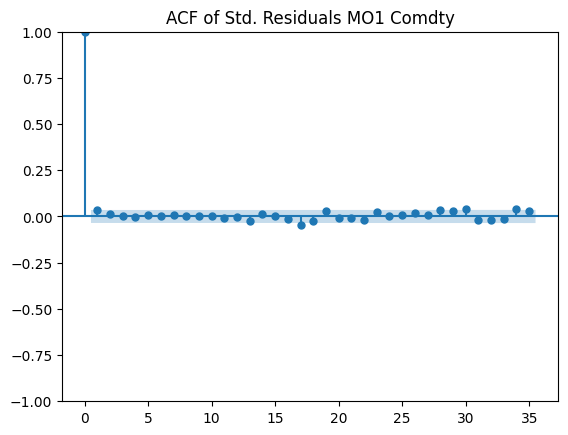

In [18]:
plot_acf(best_t_result.std_resid.dropna(), title="ACF of Std. Residuals MO1 Comdty")
plt.show()

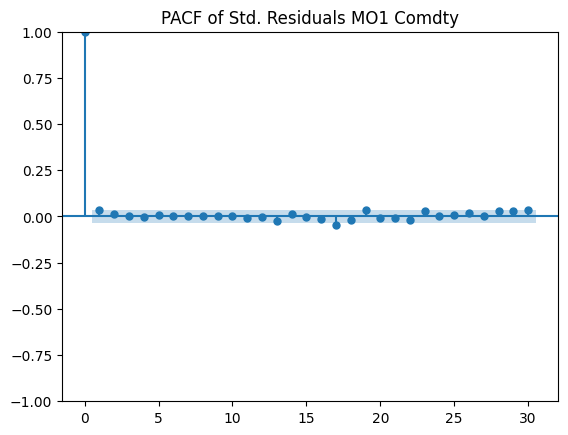

In [19]:
plot_pacf(best_t_result.std_resid.dropna(), lags = 30,  title="PACF of Std. Residuals MO1 Comdty")
plt.show()

Looks like most of the existing autocorelation has been removed by the Garch model.

In [20]:
best_t_result.std_resid

Date
2013-01-03         NaN
2013-01-04         NaN
2013-01-07         NaN
2013-01-08         NaN
2013-01-09         NaN
                ...   
2025-01-27   -1.543359
2025-01-28    0.499115
2025-01-29    1.545646
2025-01-30   -0.139587
2025-01-31    1.012232
Name: std_resid, Length: 3119, dtype: float64

### Arch-Garch Modelling All variables

In [21]:
bic_table = pd.DataFrame(columns=["Ticker" ,"Lags", "p", "q", "BIC"])

for col_name in tqdm(log_returns_scaled.columns):
    for lag in range(8):
        for p in range(1, 10):
            for q in range(1, 10):
                garch_t_model = arch_model(log_returns_scaled[col_name], mean='AR', lags=lag, vol='Garch', p=p, q=q, dist='t')
                garch_t_result = garch_t_model.fit(disp='off')

                given_bic = garch_t_result.bic

                bic_table = pd.concat([bic_table, pd.DataFrame([{"Ticker": col_name, "Lags": lag, "p": p, "q": q, "BIC": given_bic}])], ignore_index=True)

bic_table

  0%|          | 0/20 [00:00<?, ?it/s]/var/folders/mq/fwlcfkh5473f1v14fcsfsgq80000gn/T/ipykernel_9766/212919704.py:12: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  bic_table = pd.concat([bic_table, pd.DataFrame([{"Ticker": col_name, "Lags": lag, "p": p, "q": q, "BIC": given_bic}])], ignore_index=True)
 10%|█         | 2/20 [01:40<14:47, 49.30s/it]/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/arch/univariate/base.py:768: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
 65%|██████▌   | 13/20 [10:03<05:02, 43.14s/it]/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.1

,Ticker,Lags,p,q,BIC
0,MO1 Comdty - Last Price,0,1,1,29250.753887
1,MO1 Comdty - Last Price,0,1,2,29258.799155
2,MO1 Comdty - Last Price,0,1,3,29266.815275
3,MO1 Comdty - Last Price,0,1,4,29274.491130
4,MO1 Comdty - Last Price,0,1,5,29282.055769
...,...,...,...,...,...
12955,LBEATREU Index - Last Price,7,9,5,13483.757890
12956,LBEATREU Index - Last Price,7,9,6,13486.840577
12957,LBEATREU Index - Last Price,7,9,7,13492.637489
12958,LBEATREU Index - Last Price,7,9,8,13497.671387


In [22]:
ref_table = bic_table.loc[bic_table.groupby('Ticker')['BIC'].idxmin()]

In [23]:
ref_table

,Ticker,Lags,p,q,BIC
5265,CAC Index - Last Price,1,1,1,23032.911114
810,CO1 Comdty - Last Price,2,1,1,27151.131000
5913,DAX Index - Last Price,1,1,1,23183.164622
10773,ECO Index - Last Price,5,1,1,27178.144959
8586,EURCHF Curncy - Last Price,2,1,1,15248.167207
9234,EURCNY Curncy - Last Price,2,1,1,17737.700943
7938,EURGBP Curncy - Last Price,2,1,1,17817.950002
10288,EURRUB Curncy - Last Price,7,1,2,22699.691162
7695,EURUSD Curncy - Last Price,7,1,1,18264.746748
12312,LBEATREU Index - Last Price,0,1,1,13373.936223


In [24]:
garch_returns = pd.DataFrame()

for col_name in log_returns_scaled:
    lag = ref_table[ref_table["Ticker"] == col_name]["Lags"].values[0]
    p = ref_table[ref_table["Ticker"] == col_name]["p"].values[0]
    q = ref_table[ref_table["Ticker"] == col_name]["q"].values[0]

    garch_t_model = arch_model(log_returns_scaled[col_name], mean='AR', lags=lag, vol='Garch', p=p, q=q, dist='t')
    garch_t_result = garch_t_model.fit(disp='off')

    residulas = garch_t_result.std_resid

    garch_returns[col_name] = residulas


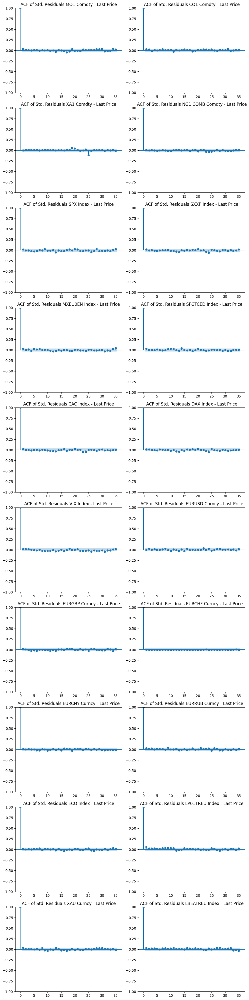

In [25]:
fig, axes = plt.subplots(10, 2, figsize=(10, 40))
axes = axes.flatten()

i = 0
for col_name in log_returns_scaled:
    lag = ref_table[ref_table["Ticker"] == col_name]["Lags"].values[0]
    p = ref_table[ref_table["Ticker"] == col_name]["p"].values[0]
    q = ref_table[ref_table["Ticker"] == col_name]["q"].values[0]

    garch_t_model = arch_model(log_returns_scaled[col_name], mean='AR', lags=lag, vol='Garch', p=p, q=q, dist='t')
    garch_t_result = garch_t_model.fit(disp='off')

    plot_acf(garch_t_result.std_resid.dropna(), title="ACF of Std. Residuals " + col_name, ax=axes[i])
    i += 1
plt.tight_layout()
plt.show()

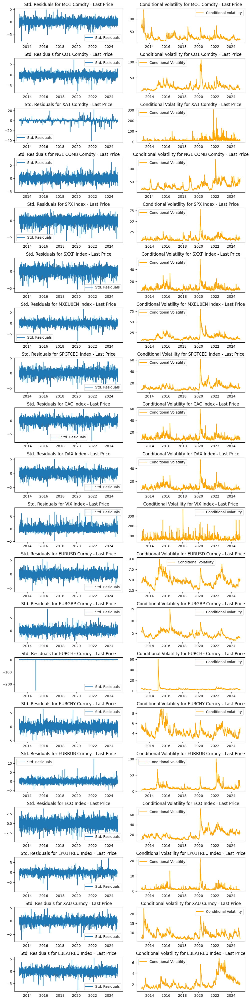

In [26]:
fig, axes = plt.subplots(20, 2, figsize=(10, 40))
axes = axes.flatten()

i = 0
for col_name in log_returns_scaled:
    lag = ref_table[ref_table["Ticker"] == col_name]["Lags"].values[0]
    p = ref_table[ref_table["Ticker"] == col_name]["p"].values[0]
    q = ref_table[ref_table["Ticker"] == col_name]["q"].values[0]

    garch_t_model = arch_model(log_returns_scaled[col_name], mean='AR', lags=lag, vol='Garch', p=p, q=q, dist='t')
    garch_t_result = garch_t_model.fit(disp='off')

    residuals = garch_t_result.std_resid
    conditional_volatility = garch_t_result.conditional_volatility

    # Plot the residuals
    axes[i].plot(residuals, label='Std. Residuals')
    axes[i].set_title(f'Std. Residuals for {col_name}')
    axes[i].legend()

    # Plot the conditional volatility
    axes[i + 1].plot(conditional_volatility, label='Conditional Volatility', color='orange')
    axes[i + 1].set_title(f'Conditional Volatility for {col_name}')
    axes[i + 1].legend()
    i += 2
plt.tight_layout()
plt.show()

In [27]:
garch_returns

,MO1 Comdty - Last Price,CO1 Comdty - Last Price,XA1 Comdty - Last Price,NG1 COMB Comdty - Last Price,SPX Index - Last Price,SXXP Index - Last Price,MXEU0EN Index - Last Price,SPGTCED Index - Last Price,CAC Index - Last Price,DAX Index - Last Price,VIX Index - Last Price,EURUSD Curncy - Last Price,EURGBP Curncy - Last Price,EURCHF Curncy - Last Price,EURCNY Curncy - Last Price,EURRUB Curncy - Last Price,ECO Index - Last Price,LP01TREU Index - Last Price,XAU Curncy - Last Price,LBEATREU Index - Last Price
Date,,,,,,,,,,,,,,,,,,,,
2013-01-03,NaN,NaN,NaN,NaN,NaN,0.848721,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.198803
2013-01-04,NaN,NaN,NaN,NaN,0.773515,0.503839,NaN,NaN,0.173348,0.219040,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.598916
2013-01-07,NaN,-0.005805,NaN,NaN,-0.781732,-0.918595,NaN,NaN,-0.954230,-0.910014,NaN,NaN,0.187466,0.002724,-0.055763,NaN,NaN,1.397256,NaN,0.407456
2013-01-08,NaN,0.534894,NaN,NaN,-0.877902,-0.373414,-0.243320,NaN,-0.085692,-0.806673,NaN,NaN,0.235826,0.097834,1.081339,NaN,NaN,0.899361,0.992043,1.183524
2013-01-09,NaN,-0.277352,0.139131,NaN,0.298258,1.136490,1.249352,NaN,0.301962,0.301591,NaN,NaN,0.141549,0.043583,-0.315716,NaN,NaN,0.417965,-0.129656,0.308762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-27,-1.547012,-1.334867,0.218279,-1.777289,-2.082447,-0.233806,-0.742608,-0.467991,-0.373260,-0.763117,3.238501,-0.110709,-0.447525,-1.616417,0.069149,-0.318189,-1.994771,-0.292898,-0.032529,0.770663
2025-01-28,0.492416,0.292773,0.733807,-1.289377,0.772544,0.481294,0.135953,-0.644497,-0.242325,0.735357,-0.714433,-1.003608,-0.442780,-1.037761,-3.764175,0.044377,-0.546938,-0.293198,-0.033012,-0.353002
2025-01-29,1.540436,-0.886318,-0.244688,0.276254,-0.553183,0.735539,0.185597,1.370841,-0.496337,1.117930,0.188803,-0.069473,-0.487144,0.532616,-0.289890,0.857429,0.092072,-0.293433,-0.033490,-0.295777


In [28]:
garch_returns.isna().sum()

MO1 Comdty - Last Price         7
CO1 Comdty - Last Price         2
XA1 Comdty - Last Price         4
NG1 COMB Comdty - Last Price    7
SPX Index - Last Price          1
SXXP Index - Last Price         0
MXEU0EN Index - Last Price      3
SPGTCED Index - Last Price      7
CAC Index - Last Price          1
DAX Index - Last Price          1
VIX Index - Last Price          7
EURUSD Curncy - Last Price      7
EURGBP Curncy - Last Price      2
EURCHF Curncy - Last Price      2
EURCNY Curncy - Last Price      2
EURRUB Curncy - Last Price      7
ECO Index - Last Price          5
LP01TREU Index - Last Price     2
XAU Curncy - Last Price         3
LBEATREU Index - Last Price     0
dtype: int64

In [29]:
garch_returns = garch_returns.dropna() / 1000

In [30]:
garch_returns.describe()

,MO1 Comdty - Last Price,CO1 Comdty - Last Price,XA1 Comdty - Last Price,NG1 COMB Comdty - Last Price,SPX Index - Last Price,SXXP Index - Last Price,MXEU0EN Index - Last Price,SPGTCED Index - Last Price,CAC Index - Last Price,DAX Index - Last Price,VIX Index - Last Price,EURUSD Curncy - Last Price,EURGBP Curncy - Last Price,EURCHF Curncy - Last Price,EURCNY Curncy - Last Price,EURRUB Curncy - Last Price,ECO Index - Last Price,LP01TREU Index - Last Price,XAU Curncy - Last Price,LBEATREU Index - Last Price
count,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000
mean,-0.000006,-0.000048,-0.000020,0.000005,-0.000074,-0.000075,-0.000038,-0.000019,-0.000069,-0.000061,0.000109,-0.000002,0.000026,-0.000059,0.000003,0.000043,-0.000026,-0.000056,-0.000011,-0.000035
std,0.001002,0.001002,0.001858,0.001002,0.000993,0.000987,0.001000,0.000995,0.000991,0.000978,0.000994,0.001002,0.001002,0.004604,0.000997,0.001017,0.000999,0.000997,0.000989,0.001004
min,-0.007610,-0.007503,-0.041245,-0.004753,-0.006219,-0.005717,-0.008093,-0.005881,-0.007535,-0.006132,-0.004691,-0.005869,-0.003807,-0.250645,-0.004874,-0.005000,-0.004395,-0.008905,-0.007200,-0.007678
25%,-0.000585,-0.000589,-0.000308,-0.000607,-0.000567,-0.000587,-0.000589,-0.000610,-0.000582,-0.000565,-0.000499,-0.000614,-0.000597,-0.000553,-0.000579,-0.000553,-0.000637,-0.000538,-0.000531,-0.000610
50%,-0.000005,0.000013,0.000002,0.000001,-0.000052,-0.000017,0.000011,-0.000009,-0.000017,-0.000027,-0.000011,0.000012,-0.000019,-0.000017,0.000008,0.000005,0.000003,-0.000011,-0.000003,-0.000035
75%,0.000594,0.000567,0.000333,0.000599,0.000557,0.000524,0.000568,0.000559,0.000541,0.000515,0.000561,0.000624,0.000594,0.000606,0.000585,0.000590,0.000628,0.000510,0.000543,0.000550
max,0.004827,0.007089,0.021969,0.007182,0.003413,0.003476,0.006294,0.004563,0.004366,0.004983,0.008083,0.005365,0.008577,0.007521,0.006465,0.012607,0.003847,0.006937,0.004706,0.005271


### Simple Bayesian Network

Bayesian Network Module Import

In [31]:
from pgmpy.estimators import HillClimbSearch, TreeSearch, BicScore
from pgmpy.models import BayesianNetwork
from pgmpy.estimators import MaximumLikelihoodEstimator
from pgmpy.estimators import BayesianEstimator
from pgmpy.estimators import PC
from pgmpy.estimators import MmhcEstimator
from pgmpy.inference import VariableElimination, CausalInference

In [32]:
# Desired number of categories to encode log return data into accoding on the position within the distribution. 
n_bins = 3

#### Equal Lenght Binning

In [ ]:
binned_returns_equal_l = garch_returns.copy()

# bins = [-float("inf"), -0.1, -0.05, -0.02, -0.005, 0.005, 0.02, 0.05, 0.1, float("inf")]
# labels = ["Extremely Low", "Very Low", "Low", "Slightly Low", "Neutral", "Slightly High", "High", "Very High", "Extremely High"]

for col in garch_returns.columns:
    bins = np.linspace(binned_returns_equal_l[col].min(), binned_returns_equal_l[col].max(), n_bins + 1)
    #labels = range(1, n_bins + 1)
    labels = ["Low", "Neutral", "High"]
    binned_returns_equal_l[col] = pd.cut(binned_returns_equal_l[col], bins=bins, labels=labels)

#### Quantile Binning

In [33]:
binned_returns_quantile = garch_returns.copy()

for col in garch_returns.columns:
    # labels = range(1, n_bins + 1)
    labels = ["Low", "Neutral", "High"]
    binned_returns_quantile[col] = pd.qcut(binned_returns_quantile[col], q=n_bins, labels=labels)

#### K-Bins Binning

In [ ]:
from sklearn.preprocessing import KBinsDiscretizer

In [ ]:
binned_returns_kbins = garch_returns.copy()

for col in garch_returns.columns:
    discretizer = KBinsDiscretizer(n_bins=n_bins, encode='ordinal', strategy='kmeans')
    binned_returns_kbins[col] = discretizer.fit_transform(binned_returns_kbins[col].values.reshape(-1, 1))

#### Hartemink Binning

As of now there is no python implementation.

#### Rendering Our Binning Technique of Choice

In [34]:
# Current version
binned_returns = binned_returns_quantile

In [35]:
binned_returns

,MO1 Comdty - Last Price,CO1 Comdty - Last Price,XA1 Comdty - Last Price,NG1 COMB Comdty - Last Price,SPX Index - Last Price,SXXP Index - Last Price,MXEU0EN Index - Last Price,SPGTCED Index - Last Price,CAC Index - Last Price,DAX Index - Last Price,VIX Index - Last Price,EURUSD Curncy - Last Price,EURGBP Curncy - Last Price,EURCHF Curncy - Last Price,EURCNY Curncy - Last Price,EURRUB Curncy - Last Price,ECO Index - Last Price,LP01TREU Index - Last Price,XAU Curncy - Last Price,LBEATREU Index - Last Price
Date,,,,,,,,,,,,,,,,,,,,
2013-01-14,Neutral,High,Low,High,Low,Low,Low,Low,Neutral,Neutral,Neutral,High,High,High,High,Low,Low,Low,High,Neutral
2013-01-15,High,Low,Neutral,High,Neutral,Neutral,High,High,Low,Low,Neutral,Low,Low,High,Neutral,Low,High,Low,High,High
2013-01-16,Low,Neutral,Neutral,Neutral,Neutral,Neutral,Neutral,Low,Neutral,Neutral,Neutral,Neutral,High,Neutral,Low,Low,Low,Low,Neutral,Neutral
2013-01-17,Neutral,High,High,High,High,High,Neutral,Neutral,High,High,Neutral,High,High,High,High,Neutral,Neutral,Neutral,High,Low
2013-01-18,Low,High,Low,High,High,Neutral,Neutral,High,Neutral,Low,Low,Low,High,Low,High,Low,Neutral,Neutral,Neutral,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-27,Low,Low,High,Low,Low,Neutral,Low,Low,Low,Low,High,Neutral,Low,Low,Neutral,Neutral,Low,Neutral,Neutral,High
2025-01-28,High,Neutral,High,Low,High,High,Neutral,Low,Neutral,High,Low,Low,Low,Low,Low,Neutral,Low,Neutral,Neutral,Neutral
2025-01-29,High,Low,Low,Neutral,Low,High,Neutral,High,Low,High,Neutral,Neutral,Low,High,Neutral,High,Neutral,Neutral,Neutral,Neutral


In [ ]:
# Export for Genie Inference
# binned_returns.to_csv("EUAQuantileEncoded.csv")

#### Bootstraping

Since AR-Garch removed most of the time dependence from the data we can bootstrap the data to compare different structures of bayesian networks.

In [36]:
boots_samples_list = []
n_bootstrap_samples = 200

for i in range(n_bootstrap_samples):
    boots_samples_list.append(binned_returns.sample(frac=1, replace=True, random_state=42))

#### Hill-climb estimation - no/bootstrap/test

Possible connection map

In [56]:
binned_returns.columns

Index(['MO1 Comdty - Last Price', 'CO1 Comdty - Last Price',
       'XA1 Comdty - Last Price', 'NG1 COMB Comdty - Last Price',
       'SPX Index - Last Price', 'SXXP Index - Last Price',
       'MXEU0EN Index - Last Price', 'SPGTCED Index - Last Price',
       'CAC Index - Last Price', 'DAX Index - Last Price',
       'VIX Index - Last Price', 'EURUSD Curncy - Last Price',
       'EURGBP Curncy - Last Price', 'EURCHF Curncy - Last Price',
       'EURCNY Curncy - Last Price', 'EURRUB Curncy - Last Price',
       'ECO Index - Last Price', 'LP01TREU Index - Last Price',
       'XAU Curncy - Last Price', 'LBEATREU Index - Last Price'],
      dtype='object')

In [57]:
# Define Whitelist
whitelist = [
    ("XA1 Comdty - Last Price", "MO1 Comdty - Last Price"),  # Coal → EUA
    ("NG1 COMB Comdty - Last Price", "MO1 Comdty - Last Price"),  # Gas → EUA
    ("CO1 Comdty - Last Price", "NG1 COMB Comdty - Last Price"),  # Oil → Gas
    ("EURUSD Curncy - Last Price", "MO1 Comdty - Last Price"),  # EUR/USD → EUA
    ("SXXP Index - Last Price", "MO1 Comdty - Last Price"),  # STOXX 600 → EUA
    ("SPX Index - Last Price", "MO1 Comdty - Last Price"),  # STOXX 600 → EUA
    ("MXEU0EN Index - Last Price", "MO1 Comdty - Last Price"),  # MSCI Europe Energy → EUA
    ("SPGTCED Index - Last Price", "MO1 Comdty - Last Price"),  # S&P Global Clean Energy → EUA
    ("ECO Index - Last Price", "MO1 Comdty - Last Price"),  # WilderHill Clean Energy → EUA
    ("LP01TREU Index - Last Price", "MO1 Comdty - Last Price"),  # Bloomberg Pan-European High Yield → EUA
    ("MXEU0EN Index - Last Price", "XA1 Comdty - Last Price"),
    ("MXEU0EN Index - Last Price", "NG1 Comdty - Last Price"),
    ("MXEU0EN Index - Last Price", "CO1 Comdty - Last Price"),
    ("XA1 Comdty - Last Price", "MXEU0EN Index - Last Price"),
    ("NG1 Comdty - Last Price", "MXEU0EN Index - Last Price"),
    ("CO1 Comdty - Last Price", "MXEU0EN Index - Last Price"),
    ("SXXP Index - Last Price", "SPX Index - Last Price"),
    ("SPX Index - Last Price", "SXXP Index - Last Price"),
    ("CAC Index - Last Price", "SXXP Index - Last Price"),
    ("DAX Index - Last Price", "SXXP Index - Last Price"),
    ("VIX Index - Last Price", "SPX Index - Last Price"),
    ("SPX Index - Last Price", "VIX Index - Last Price"),
    ("XAU Curncy - Last Price", "VIX Index - Last Price"),
    ("VIX Index - Last Price", "XAU Curncy - Last Price"),
    ("LBEATREU Index - Last Price", "MO1 Comdty - Last Price"),
    ("EURUSD Curncy - Last Price", "EURCHF Curncy - Last Price"),
    ("EURUSD Curncy - Last Price", "EURGBP Curncy - Last Price"),
    ("EURUSD Curncy - Last Price", "EURRUB Curncy - Last Price"),
    ("EURUSD Curncy - Last Price", "EURCNY Curncy - Last Price"),
    ("EURCHF Curncy - Last Price", "EURUSD Curncy - Last Price"),
    ("EURGBP Curncy - Last Price", "EURUSD Curncy - Last Price"),
    ("EURRUB Curncy - Last Price", "EURUSD Curncy - Last Price"),
    ("EURCNY Curncy - Last Price", "EURUSD Curncy - Last Price")
]

# Define Blacklist
blacklist = [
    ("MO1 Comdty - Last Price", "XA1 Comdty - Last Price"),  # EUA → Coal 
    ("MO1 Comdty - Last Price", "NG1 COMB Comdty - Last Price"),  # EUA → Gas
    ("MO1 Comdty - Last Price", "CO1 Comdty - Last Price"),  # EUA → Oil
    ("MO1 Comdty - Last Price", "EURUSD Curncy - Last Price"),  # EUA → EUR/USD
    ("MO1 Comdty - Last Price", "SXXP Index - Last Price"),  # EUA → STOXX 600
    ("MO1 Comdty - Last Price", "MXEU0EN Index - Last Price"),  # EUA → MSCI Europe Energy
]


In [45]:
# Difference estimators to BIC - Strong penalty
from pgmpy.metrics import log_likelihood_score
from pgmpy.estimators import AICScore # Does not penalise model complexity as strongly as BIC
from pgmpy.estimators import K2Score # No penalty for complexity
from pgmpy.estimators import BDeuScore # Penalty with prior hyperparameters. Requires equivalent sample size hyperparam.

In [59]:
hc = HillClimbSearch(binned_returns)
best_model = hc.estimate(scoring_method=BicScore(binned_returns), white_list=whitelist, black_list=blacklist, tabu_length=100)

print(best_model.edges())  # Show learned structure
print(len(best_model.edges()))

  0%|          | 0/1000000 [00:00<?, ?it/s]

[('CO1 Comdty - Last Price', 'NG1 COMB Comdty - Last Price'), ('XA1 Comdty - Last Price', 'MO1 Comdty - Last Price'), ('XA1 Comdty - Last Price', 'MXEU0EN Index - Last Price'), ('SPX Index - Last Price', 'VIX Index - Last Price'), ('SXXP Index - Last Price', 'SPX Index - Last Price'), ('MXEU0EN Index - Last Price', 'CO1 Comdty - Last Price'), ('CAC Index - Last Price', 'SXXP Index - Last Price'), ('DAX Index - Last Price', 'SXXP Index - Last Price'), ('EURUSD Curncy - Last Price', 'EURGBP Curncy - Last Price'), ('EURUSD Curncy - Last Price', 'EURRUB Curncy - Last Price'), ('EURUSD Curncy - Last Price', 'EURCHF Curncy - Last Price'), ('EURCNY Curncy - Last Price', 'EURUSD Curncy - Last Price')]
12


### Choosing a Bootstrap Alg.

In [ ]:
equivalent_sample_size = 10

#### Hill-climb w/ bootstrapping

In [60]:
learned_structures = []
for i in tqdm(range(len(boots_samples_list))):
    hc = HillClimbSearch(boots_samples_list[i])
    best_model = hc.estimate(scoring_method=BicScore(boots_samples_list[i]), show_progress=False, black_list=blacklist)
    learned_structures.append(best_model.edges())

100%|██████████| 200/200 [01:18<00:00,  2.56it/s]


#### Pure Hillclimb with Tabu 0

In [80]:
learned_structures = []
for i in tqdm(range(len(boots_samples_list))):
    hc = HillClimbSearch(boots_samples_list[i])
    best_model = hc.estimate(scoring_method=BicScore(boots_samples_list[i]), show_progress=False, black_list=blacklist, tabu_length=0)
    learned_structures.append(best_model.edges())

100%|██████████| 200/200 [01:17<00:00,  2.57it/s]


#### HC with BDeu, AIC and K2

In [ ]:
learned_structures = []
for i in tqdm(range(len(boots_samples_list))):
    hc = HillClimbSearch(boots_samples_list[i])
    best_model = hc.estimate(scoring_method=BDeuScore(boots_samples_list[i], equivalent_sample_size=equivalent_sample_size), show_progress=False, black_list=blacklist)
    learned_structures.append(best_model.edges())

100%|██████████| 200/200 [01:30<00:00,  2.20it/s]


In [ ]:
# COMPUTATIONALLY INFEASABLE on BN stage
learned_structures = []
for i in tqdm(range(len(boots_samples_list))):
    hc = HillClimbSearch(boots_samples_list[i])
    best_model = hc.estimate(scoring_method=K2Score(boots_samples_list[i]), show_progress=False, black_list=blacklist)
    learned_structures.append(best_model.edges())

100%|██████████| 200/200 [05:44<00:00,  1.72s/it]


In [ ]:
learned_structures = []
for i in tqdm(range(len(boots_samples_list))):
    hc = HillClimbSearch(boots_samples_list[i])
    best_model = hc.estimate(scoring_method=AICScore(boots_samples_list[i]), show_progress=False, black_list=blacklist)
    learned_structures.append(best_model.edges())

100%|██████████| 200/200 [03:30<00:00,  1.05s/it]


#### ExaustiveSearch

Infeasable

In [ ]:
# learned_structures = []
# for i in range(len(boots_samples_list)):
#     es = ExhaustiveSearch(boots_samples_list[i], scoring_method=BicScore(boots_samples_list[i]))
#     best_model = es.estimate()
#     learned_structures.append(best_model.edges())

#### TreeSearch

In [ ]:
learned_structures = []
for i in tqdm(range(len(boots_samples_list))):
    ts = TreeSearch(boots_samples_list[i])
    best_model = ts.estimate(estimator_type="chow-liu", show_progress=False)
    learned_structures.append(best_model.edges())

100%|██████████| 200/200 [00:17<00:00, 11.21it/s]


#### PC

In [ ]:
# import warnings
# warnings.simplefilter(action='ignore', category=FutureWarning)
# print("Est. run time:", (26*50)/60)

Est. run time: 21.666666666666668


In [ ]:
# # To save time we will try less bootstrap.
# boots_samples_list_PC = []
# n_bootstrap_samples_PC = 20

# for i in range(n_bootstrap_samples_PC):
#     boots_samples_list_PC.append(binned_returns.sample(frac=1, replace=True))

In [ ]:
# learned_structures = []
# for i in range(len(boots_samples_list_PC)):
#     est = PC(boots_samples_list_PC[i])
#     skel, seperating_sets = est.build_skeleton(significance_level=0.01)
#     pdag = est.skeleton_to_pdag(skel, seperating_sets)
#     best_model = pdag.to_dag()
#     learned_structures.append(best_model.edges())

In [38]:
est = PC(binned_returns)
skel, seperating_sets = est.build_skeleton(significance_level=0.01)
pdag = est.skeleton_to_pdag(skel, seperating_sets)
PCmodel = pdag.to_dag()

  0%|          | 0/5 [00:00<?, ?it/s]

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/pgmpy/estimators/CITests.py:542: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data.groupby([X, Y]).size().unstack(Y, fill_value=0), lambda_=lambda_
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/pgmpy/estimators/CITests.py:542: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data.groupby([X, Y]).size().unstack(Y, fill_value=0), lambda_=lambda_
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/pgmpy/estimators/CITests.py:542: FutureWarning: The default of observed=False 

In [40]:
PCedges = list(PCmodel.edges())

In [39]:
PCset = set(binned_returns.columns) - set(PCmodel.nodes)
PC_binned_returns = binned_returns.copy()
PC_binned_returns = PC_binned_returns.drop(PCset, axis=1)

In [41]:
G = nx.DiGraph()
G.add_edges_from(PCedges)

# Check if the graph is acyclic
if nx.is_directed_acyclic_graph(G):
    print("The graph is a DAG!")
else:
    print("The graph contains a cycle!")

    cycles = list(nx.simple_cycles(G))

    for cycle in cycles:
        PCedges.remove((cycle[0], cycle[1]))

The graph contains a cycle!


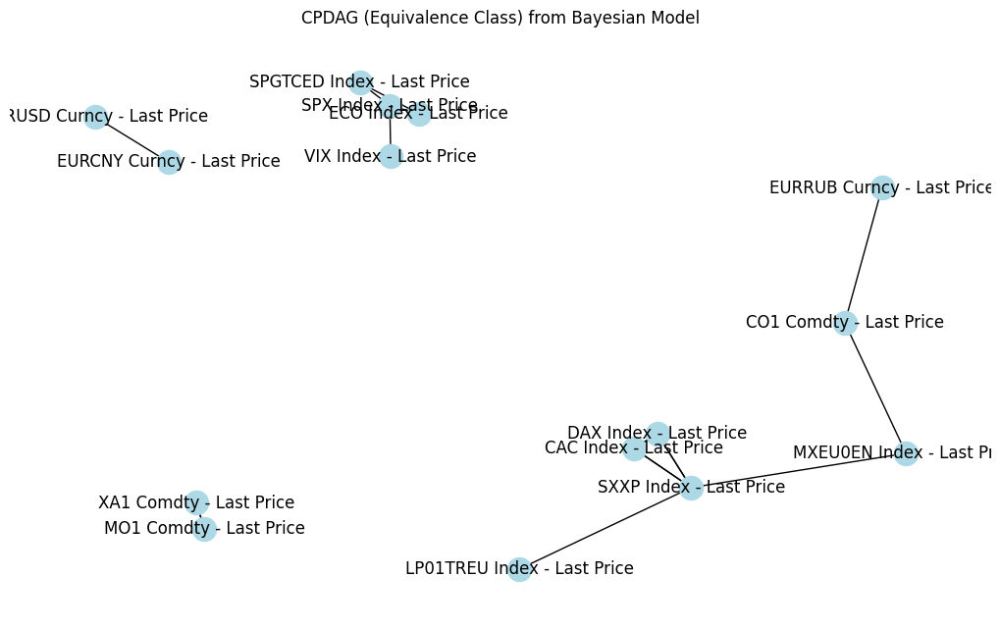

In [42]:
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(pdag)
nx.draw(pdag, pos, with_labels=True, node_color="lightblue", edge_color="black", arrows=False)
plt.title("CPDAG (Equivalence Class) from Bayesian Model")
plt.show()

In [43]:
bayesian_model = BayesianNetwork(PCedges)
bayesian_model.fit(binned_returns, estimator=MaximumLikelihoodEstimator, n_jobs=-1)

In [46]:
score = log_likelihood_score(bayesian_model, PC_binned_returns)
aic_scorer = AICScore(PC_binned_returns)
aic_score = aic_scorer.score(bayesian_model)
bic_scorer = BicScore(PC_binned_returns)
bic_score = bic_scorer.score(bayesian_model)
bdeu_scorer = BDeuScore(PC_binned_returns, equivalent_sample_size=equvalent_sample_size)
bdeu_score = bdeu_scorer.score(bayesian_model)
k2_scorer = K2Score(PC_binned_returns)
k2_score = k2_scorer.score(bayesian_model)


In [47]:
scores_table = pd.DataFrame({
    'Metric': ['Log-Likelihood', 'AIC', 'BIC', 'BDeu', 'K2'],
    'Score': [score, aic_score, bic_score, bdeu_score, k2_score]
})
scores_table

,Metric,Score
0,Log-Likelihood,-44168.196833
1,AIC,-44262.196833
2,BIC,-44546.218814
3,BDeu,-44452.061316
4,K2,-44459.554609


#### MMHC

In [ ]:
# mmhc = MmhcEstimator(binned_returns)
# skeleton = mmhc.mmpc()
# print("Part 1) Skeleton: ", skeleton.edges())

Computationally too expensive.

#### Further Bootstrapping

In [81]:
pair_count = {}
for i in range(len(learned_structures)):
    for outgoing, ingoing in learned_structures[i]:
        key = outgoing + ":" + ingoing
        if key in pair_count:
            pair_count[key] += 1
        else:
            pair_count[key] = 1

In [82]:
sorted_dict_desc = dict(sorted(pair_count.items(), key=lambda item: item[1], reverse=True))
print(sorted_dict_desc)
print(len(sorted_dict_desc))

{'CO1 Comdty - Last Price:NG1 COMB Comdty - Last Price': 200, 'XA1 Comdty - Last Price:MO1 Comdty - Last Price': 200, 'SPX Index - Last Price:VIX Index - Last Price': 200, 'SPX Index - Last Price:CAC Index - Last Price': 200, 'SPX Index - Last Price:SXXP Index - Last Price': 200, 'SXXP Index - Last Price:DAX Index - Last Price': 200, 'SXXP Index - Last Price:MXEU0EN Index - Last Price': 200, 'SXXP Index - Last Price:LP01TREU Index - Last Price': 200, 'MXEU0EN Index - Last Price:CO1 Comdty - Last Price': 200, 'MXEU0EN Index - Last Price:EURRUB Curncy - Last Price': 200, 'MXEU0EN Index - Last Price:XA1 Comdty - Last Price': 200, 'SPGTCED Index - Last Price:ECO Index - Last Price': 200, 'SPGTCED Index - Last Price:CAC Index - Last Price': 200, 'SPGTCED Index - Last Price:SPX Index - Last Price': 200, 'CAC Index - Last Price:SXXP Index - Last Price': 200, 'CAC Index - Last Price:DAX Index - Last Price': 200, 'EURUSD Curncy - Last Price:XAU Curncy - Last Price': 200, 'EURUSD Curncy - Last P

In [83]:
most_common_edges = {key: value for key, value in sorted_dict_desc.items() if value >= 100} # 50% of cases - at least
len(most_common_edges)

27

In [84]:
eua_edges = []
for key, value in most_common_edges.items():
    key_split = key.split(":")
    eua_edges.append((key_split[0], key_split[1]))

In [85]:
for i in eua_edges:
    if (i[1], i[0]) in eua_edges:
        eua_edges.remove((i[1], i[0]))

In [86]:
G = nx.DiGraph()
G.add_edges_from(eua_edges)

# Check if the graph is acyclic
if nx.is_directed_acyclic_graph(G):
    print("The graph is a DAG!")
else:
    print("The graph contains a cycle!")

    cycles = list(nx.simple_cycles(G))

    for cycle in cycles:
        eua_edges.remove((cycle[0], cycle[1]))

The graph is a DAG!


### Training a Bayesian Network

#### MLE

In [87]:
#bayesian_model = BayesianNetwork(best_model.edges)
bayesian_model = BayesianNetwork(eua_edges)
bayesian_model.fit(binned_returns, estimator=MaximumLikelihoodEstimator, n_jobs=-1)

#### BE

In [ ]:
bayesian_model = BayesianNetwork(eua_edges)
bayesian_model.fit(binned_returns, estimator=BayesianEstimator, prior_type="BDeu", equivalent_sample_size=equivalent_sample_size, n_jobs=-1)

Scores

In [88]:
score = log_likelihood_score(bayesian_model, binned_returns)
aic_scorer = AICScore(binned_returns)
aic_score = aic_scorer.score(bayesian_model)
bic_scorer = BicScore(binned_returns)
bic_score = bic_scorer.score(bayesian_model)
bdeu_scorer = BDeuScore(binned_returns, equivalent_sample_size=equvalent_sample_size)
bdeu_score = bdeu_scorer.score(bayesian_model)
k2_scorer = K2Score(binned_returns)
k2_score = k2_scorer.score(bayesian_model)


In [89]:
scores_table = pd.DataFrame({
    'Metric': ['Log-Likelihood', 'AIC', 'BIC', 'BDeu', 'K2'],
    'Score': [score, aic_score, bic_score, bdeu_score, k2_score]
})
scores_table

,Metric,Score
0,Log-Likelihood,-59799.284509
1,AIC,-60011.284509
2,BIC,-60651.844723
3,BDeu,-60431.788668
4,K2,-60391.467568


In [75]:
from pgmpy.inference import VariableElimination

inference = VariableElimination(bayesian_model)
prediction = inference.map_query(variables=["MO1 Comdty - Last Price"])

print(prediction)


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

{'MO1 Comdty - Last Price': 'Neutral'}


In [76]:
bayesian_model.edges()

OutEdgeView([('CO1 Comdty - Last Price', 'NG1 COMB Comdty - Last Price'), ('XA1 Comdty - Last Price', 'MO1 Comdty - Last Price'), ('SPX Index - Last Price', 'VIX Index - Last Price'), ('SPX Index - Last Price', 'CAC Index - Last Price'), ('SPX Index - Last Price', 'SXXP Index - Last Price'), ('CAC Index - Last Price', 'SXXP Index - Last Price'), ('CAC Index - Last Price', 'DAX Index - Last Price'), ('SXXP Index - Last Price', 'DAX Index - Last Price'), ('SXXP Index - Last Price', 'MXEU0EN Index - Last Price'), ('SXXP Index - Last Price', 'LP01TREU Index - Last Price'), ('MXEU0EN Index - Last Price', 'CO1 Comdty - Last Price'), ('MXEU0EN Index - Last Price', 'EURRUB Curncy - Last Price'), ('MXEU0EN Index - Last Price', 'XA1 Comdty - Last Price'), ('LP01TREU Index - Last Price', 'EURGBP Curncy - Last Price'), ('LP01TREU Index - Last Price', 'LBEATREU Index - Last Price'), ('SPGTCED Index - Last Price', 'ECO Index - Last Price'), ('SPGTCED Index - Last Price', 'CAC Index - Last Price'), (

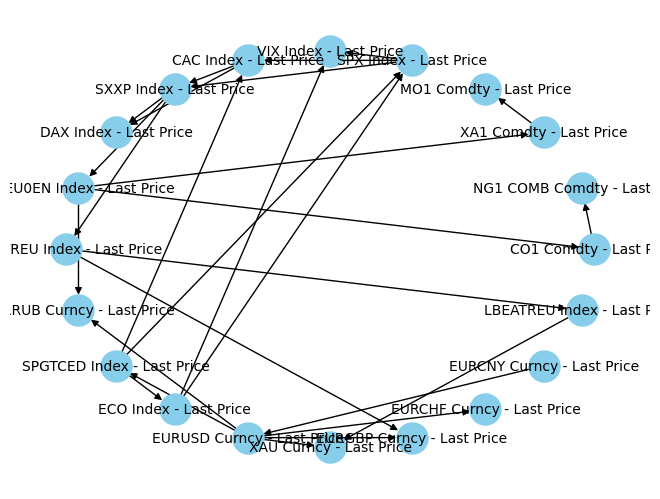

In [77]:
# Plot with spring layout
pos = nx.kamada_kawai_layout(bayesian_model)  # Use spring layout for better spread
nx.draw(bayesian_model, pos, with_labels=True, node_size=500, node_color="skyblue", font_size=10)
plt.show()

#### SAVE Module

In [78]:
model_graphviz = bayesian_model.to_graphviz()

# Plot the model.
model_graphviz.draw("./DAGoutput/HCBICv1.png", prog="dot")

In [79]:
# Works with Genie
from pgmpy.readwrite import XMLBIFWriter

writer = XMLBIFWriter(bayesian_model)
writer.write_xmlbif('./Models/HCBICv1.bif')

In [ ]:
# ## Old non-xml bif writer
# from pgmpy.readwrite import BIFWriter

# writer = BIFWriter(bayesian_model)
# writer.write_bif('./Models/FINALmodelNONXML.bif')

In [ ]:
# ## NET
# from pgmpy.readwrite import NETWriter

# writer = NETWriter(bayesian_model)
# writer.write_net('./Models/FINALmodelNONXML.net')

In [ ]:
# for cpd in bayesian_model.get_cpds():
#     print(f"CPD of {cpd.variable}:")
#     print(cpd)

#### KL Divergence

In [ ]:
from scipy.stats import entropy

In [ ]:
VE_model = VariableElimination(bayesian_model)
CI_model = CausalInference(bayesian_model)

In [ ]:
for i in range(1): #len(binned_returns.columns)):
    for j in range(len(binned_returns.columns)):
        if j == i:
            continue
        VE_regime_high = VE_model.query(variables=[binned_returns.columns[i]], evidence={binned_returns.columns[j]: "High"}, show_progress=False).values
        VE_regime_neutral = VE_model.query(variables=[binned_returns.columns[i]], evidence={binned_returns.columns[j]: "Neutral"}, show_progress=False).values
        VE_regime_low = VE_model.query(variables=[binned_returns.columns[i]], evidence={binned_returns.columns[j]: "Low"}, show_progress=False).values

        CI_regime_high = CI_model.query(variables=[binned_returns.columns[i]], do={binned_returns.columns[j]: "High"}, show_progress=False).values
        CI_regime_neutral = CI_model.query(variables=[binned_returns.columns[i]], do={binned_returns.columns[j]: "Neutral"}, show_progress=False).values
        CI_regime_low = CI_model.query(variables=[binned_returns.columns[i]], do={binned_returns.columns[j]: "Low"}, show_progress=False).values

        KL_high = entropy(VE_regime_high, CI_regime_high)
        KL_neutral = entropy(VE_regime_neutral, CI_regime_neutral)
        KL_low = entropy(VE_regime_low, CI_regime_low)

        print("Results for: ", binned_returns.columns[j], " in regime:\n")
        print("HIGH: ", KL_high)
        print("NEUTRAL", KL_neutral)
        print("LOW: ", KL_low)
        print("-----------------------------------------------")

Results for:  CO1 Comdty - Last Price  in regime:

HIGH:  0.0020262733873864106
NEUTRAL 1.636057697462388e-05
LOW:  0.0017555953297277982
-----------------------------------------------
Results for:  XA1 Comdty - Last Price  in regime:

HIGH:  4.236942543652694e-05
NEUTRAL 1.531918013848721e-05
LOW:  6.470281692290792e-05
-----------------------------------------------
Results for:  NG1 COMB Comdty - Last Price  in regime:

HIGH:  1.4838253393101582e-05
NEUTRAL 5.2305760735288174e-08
LOW:  1.6675019061351116e-05
-----------------------------------------------
Results for:  SPX Index - Last Price  in regime:

HIGH:  5.936021744388869e-05
NEUTRAL 3.015045973896318e-07
LOW:  6.823413583773442e-05
-----------------------------------------------
Results for:  SXXP Index - Last Price  in regime:

HIGH:  0.0
NEUTRAL 0.0
LOW:  0.0
-----------------------------------------------
Results for:  MXEU0EN Index - Last Price  in regime:

HIGH:  -4.529691047077325e-17
NEUTRAL 0.0
LOW:  -1.771298014162

#### Variable Elimination

In [ ]:
infer = VariableElimination(bayesian_model)

Marginal Probability

In [ ]:
for i in range(0, len(binned_returns.columns)):
    g_dist = infer.query([binned_returns.columns[i]])
    print(binned_returns.columns[i], g_dist)

MO1 Comdty - Last Price +----------------------------------+--------------------------------+
| MO1 Comdty - Last Price          |   phi(MO1 Comdty - Last Price) |
+==================================+================================+
| MO1 Comdty - Last Price(High)    |                         0.3332 |
+----------------------------------+--------------------------------+
| MO1 Comdty - Last Price(Low)     |                         0.3332 |
+----------------------------------+--------------------------------+
| MO1 Comdty - Last Price(Neutral) |                         0.3335 |
+----------------------------------+--------------------------------+
CO1 Comdty - Last Price +----------------------------------+--------------------------------+
| CO1 Comdty - Last Price          |   phi(CO1 Comdty - Last Price) |
+==================================+================================+
| CO1 Comdty - Last Price(High)    |                         0.3275 |
+----------------------------------+------

In [ ]:
for i in range(1, len(binned_returns.columns)):
    g_dist = infer.query(['MO1 Comdty - Last Price'], evidence={binned_returns.columns[i]: 'High'})
    print(binned_returns.columns[i], g_dist)

CO1 Comdty - Last Price +----------------------------------+--------------------------------+
| MO1 Comdty - Last Price          |   phi(MO1 Comdty - Last Price) |
+==================================+================================+
| MO1 Comdty - Last Price(High)    |                         0.3600 |
+----------------------------------+--------------------------------+
| MO1 Comdty - Last Price(Low)     |                         0.3081 |
+----------------------------------+--------------------------------+
| MO1 Comdty - Last Price(Neutral) |                         0.3319 |
+----------------------------------+--------------------------------+
XA1 Comdty - Last Price +----------------------------------+--------------------------------+
| MO1 Comdty - Last Price          |   phi(MO1 Comdty - Last Price) |
+==================================+================================+
| MO1 Comdty - Last Price(High)    |                         0.4252 |
+----------------------------------+------

#### Local independencies and Markov blanket

In [ ]:
bayesian_model.local_independencies('MO1 Comdty - Last Price')

(MO1 Comdty - Last Price ⟂ EURCHF Curncy - Last Price, NG1 COMB Comdty - Last Price, EURRUB Curncy - Last Price, LP01TREU Index - Last Price, LBEATREU Index - Last Price, SPGTCED Index - Last Price, DAX Index - Last Price, SPX Index - Last Price, XAU Curncy - Last Price, VIX Index - Last Price, EURCNY Curncy - Last Price, EURGBP Curncy - Last Price, EURUSD Curncy - Last Price, CO1 Comdty - Last Price, CAC Index - Last Price, ECO Index - Last Price, SXXP Index - Last Price | XA1 Comdty - Last Price, MXEU0EN Index - Last Price)

In [ ]:
bayesian_model.get_markov_blanket('MO1 Comdty - Last Price')

['XA1 Comdty - Last Price', 'MXEU0EN Index - Last Price']

In [ ]:
pdag = bayesian_model.to_undirected()

In [ ]:
pdag.edges()

EdgeView([('XA1 Comdty - Last Price', 'MO1 Comdty - Last Price'), ('XA1 Comdty - Last Price', 'MXEU0EN Index - Last Price'), ('MO1 Comdty - Last Price', 'MXEU0EN Index - Last Price'), ('LP01TREU Index - Last Price', 'EURGBP Curncy - Last Price'), ('LP01TREU Index - Last Price', 'LBEATREU Index - Last Price'), ('LP01TREU Index - Last Price', 'SXXP Index - Last Price'), ('EURGBP Curncy - Last Price', 'EURUSD Curncy - Last Price'), ('SXXP Index - Last Price', 'DAX Index - Last Price'), ('SXXP Index - Last Price', 'CAC Index - Last Price'), ('SXXP Index - Last Price', 'SPGTCED Index - Last Price'), ('SXXP Index - Last Price', 'MXEU0EN Index - Last Price'), ('EURUSD Curncy - Last Price', 'EURRUB Curncy - Last Price'), ('EURUSD Curncy - Last Price', 'EURCNY Curncy - Last Price'), ('EURUSD Curncy - Last Price', 'EURCHF Curncy - Last Price'), ('EURUSD Curncy - Last Price', 'XAU Curncy - Last Price'), ('EURRUB Curncy - Last Price', 'CO1 Comdty - Last Price'), ('MXEU0EN Index - Last Price', 'CO1

### Trying Expert in the Loop DAG option

In [ ]:
from pgmpy.estimators import ExpertInLoop

#### With LLM

In [ ]:
variable_descriptions = {
    'MO1 Comdty - Last Price': 'An ordinal categorical variable representing the log return regime of European Union Allowances futures.',
    'CO1 Comdty - Last Price': 'An ordinal categorical variable representing the log return regime of Brent Crudo Oil futures.',
    'XA1 Comdty - Last Price': 'An ordinal categorical variable representing the log return regime of Rotterdam Coal futures.', 
    'NG1 COMB Comdty - Last Price': 'An ordinal categorical variable representing the log return regime of Natural Gas futures.',
    #'SPX Index - Last Price': 'An ordinal categorical variable representing the log return regime of the S&P 500 index.', 
    'SXXP Index - Last Price': 'An ordinal categorical variable representing the log return regime of the STOXX 600 index.',
    'MXEU0EN Index - Last Price': 'An ordinal categorical variable representing the log return regime of MSCI Europe Energy index.', 
    'SPGTCED Index - Last Price': 'An ordinal categorical variable representing the log return regime of S&P Global Clean Energy index.',
    # 'CAC Index - Last Price': 'An ordinal categorical variable representing the log return regime of CAC index.', 
    # 'DAX Index - Last Price': 'An ordinal categorical variable representing the log return regime of DAX index',
    #'VIX Index - Last Price': 'An ordinal categorical variable representing the log return regime of VIX volatility index', 
    #'EURUSD Curncy - Last Price': 'An ordinal categorical variable representing the log return regime of Euro to U.S. Dollar currency exchange rate.',
    # 'EURGBP Curncy - Last Price': 'An ordinal categorical variable representing the log return regime of Euro to British Pound currency exchange rate.', 
    # 'EURCHF Curncy - Last Price': 'An ordinal categorical variable representing the log return regime of Euro to Swiss Franc currency exchange rate.',
    # 'EURCNY Curncy - Last Price': 'An ordinal categorical variable representing the log return regime of Euro to Chinese Renminbi currency exchange rate.', 
    # 'EURRUB Curncy - Last Price': 'An ordinal categorical variable representing the log return regime of Euro to Russian Ruble currency exchange rate.',
    #'ECO Index - Last Price': 'An ordinal categorical variable representing the log return regime of WilderHill Clean Energy index.', 
    'LP01TREU Index - Last Price': 'An ordinal categorical variable representing the log return regime of Bloomberg Pan-European High Yield Total Return index.',
    # 'XAU Curncy - Last Price': 'An ordinal categorical variable representing the log return regime of gold spot price.', 
    # 'LBEATREU Index - Last Price': 'An ordinal categorical variable representing the log return regime of Bloomberg EuroAgg Total Return Index Value Unhedged EUR index.'
    }

In [ ]:
test_dataset = binned_returns.copy()
test_dataset = test_dataset[list(variable_descriptions.keys())]

In [ ]:
test_dataset.columns

Index(['MO1 Comdty - Last Price', 'CO1 Comdty - Last Price',
       'XA1 Comdty - Last Price', 'NG1 COMB Comdty - Last Price',
       'SXXP Index - Last Price', 'MXEU0EN Index - Last Price',
       'SPGTCED Index - Last Price', 'LP01TREU Index - Last Price'],
      dtype='object')

In [ ]:
dag = ExpertInLoop(test_dataset).estimate(
                effect_size_threshold=0.0001,
                use_llm=True,
                variable_descriptions=variable_descriptions)

In [ ]:
bayesian_model = BayesianNetwork(dag.edges())
bayesian_model.fit(test_dataset, estimator=MaximumLikelihoodEstimator, n_jobs=-1)

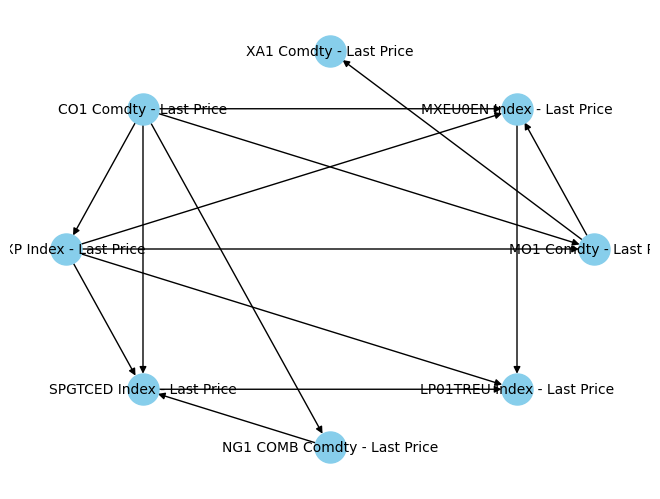

In [ ]:
# Plot with spring layout
pos = nx.kamada_kawai_layout(bayesian_model)  # Use spring layout for better spread
nx.draw(bayesian_model, pos, with_labels=True, node_size=500, node_color="skyblue", font_size=10)
plt.show()

### LLM outside try

In [ ]:
dag_connections = [
    ('CO1 Comdty - Last Price', 'MO1 Comdty - Last Price'),
    ('XA1 Comdty - Last Price', 'CO1 Comdty - Last Price'),
    ('NG1 COMB Comdty - Last Price', 'CO1 Comdty - Last Price'),
    ('NG1 COMB Comdty - Last Price', 'MO1 Comdty - Last Price'),
    ('SPX Index - Last Price', 'SXXP Index - Last Price'),
    ('SPX Index - Last Price', 'MO1 Comdty - Last Price'),
    ('SXXP Index - Last Price', 'SPGTCED Index - Last Price'),
    ('SPX Index - Last Price', 'VIX Index - Last Price'),
    ('VIX Index - Last Price', 'MO1 Comdty - Last Price'),
    ('SPX Index - Last Price', 'SPGTCED Index - Last Price'),
    ('MXEU0EN Index - Last Price', 'SXXP Index - Last Price'),
    ('MXEU0EN Index - Last Price', 'MO1 Comdty - Last Price'),
    ('SPGTCED Index - Last Price', 'MO1 Comdty - Last Price'),
    ('CAC Index - Last Price', 'SXXP Index - Last Price'),
    ('DAX Index - Last Price', 'SXXP Index - Last Price'),
    ('EURUSD Curncy - Last Price', 'MO1 Comdty - Last Price'),
    ('EURGBP Curncy - Last Price', 'EURUSD Curncy - Last Price'),
    ('EURCHF Curncy - Last Price', 'EURUSD Curncy - Last Price'),
    ('EURCNY Curncy - Last Price', 'EURUSD Curncy - Last Price'),
    ('EURRUB Curncy - Last Price', 'EURUSD Curncy - Last Price'),
    ('ECO Index - Last Price', 'SPGTCED Index - Last Price'),
    ('LP01TREU Index - Last Price', 'SXXP Index - Last Price'),
    ('XAU Curncy - Last Price', 'VIX Index - Last Price'),
    ('LBEATREU Index - Last Price', 'SXXP Index - Last Price')
]

In [ ]:
G = nx.DiGraph()
G.add_edges_from(dag_connections)

# Check if the graph is acyclic
if nx.is_directed_acyclic_graph(G):
    print("The graph is a DAG!")
else:
    print("The graph contains a cycle!")

    cycles = list(nx.simple_cycles(G))

    # for cycle in cycles:
    #     eua_edges.remove((cycle[0], cycle[1]))

The graph is a DAG!


In [ ]:
bayesian_model = BayesianNetwork(dag_connections)
bayesian_model.fit(binned_returns, estimator=MaximumLikelihoodEstimator, n_jobs=-1)

In [ ]:
model_graphviz = bayesian_model.to_graphviz()

# Plot the model.
model_graphviz.draw("./DAGoutput/LLMv2DAG.png", prog="dot")

In [ ]:
for cpd in bayesian_model.get_cpds():
    print(f"CPD of {cpd.variable}:")
    print(cpd)

CPD of CO1 Comdty - Last Price:
+----------------------------------+-----+
| NG1 COMB Comdty - Last Price     | ... |
+----------------------------------+-----+
| XA1 Comdty - Last Price          | ... |
+----------------------------------+-----+
| CO1 Comdty - Last Price(High)    | ... |
+----------------------------------+-----+
| CO1 Comdty - Last Price(Low)     | ... |
+----------------------------------+-----+
| CO1 Comdty - Last Price(Neutral) | ... |
+----------------------------------+-----+
CPD of MO1 Comdty - Last Price:
+----------------------------------+-----+
| CO1 Comdty - Last Price          | ... |
+----------------------------------+-----+
| EURUSD Curncy - Last Price       | ... |
+----------------------------------+-----+
| MXEU0EN Index - Last Price       | ... |
+----------------------------------+-----+
| NG1 COMB Comdty - Last Price     | ... |
+----------------------------------+-----+
| SPGTCED Index - Last Price       | ... |
+--------------------------------

In [ ]:
bayesian_model.get_cpds('MO1 Comdty - Last Price').to_csv(filename='LLMv2DAG_cpd.csv')

### Manually

In [ ]:
dag_connections = [
    ('CO1 Comdty - Last Price', 'MO1 Comdty - Last Price'),
    ('XA1 Comdty - Last Price', 'CO1 Comdty - Last Price'),
    ('NG1 COMB Comdty - Last Price', 'CO1 Comdty - Last Price'),
    ('NG1 COMB Comdty - Last Price', 'MO1 Comdty - Last Price'),
    ('SPX Index - Last Price', 'SXXP Index - Last Price'),
    ('SPX Index - Last Price', 'MO1 Comdty - Last Price'),
    ('SXXP Index - Last Price', 'SPGTCED Index - Last Price'),
    ('SPX Index - Last Price', 'VIX Index - Last Price'),
    ('VIX Index - Last Price', 'MO1 Comdty - Last Price'),
    ('SPX Index - Last Price', 'SPGTCED Index - Last Price'),
    ('MXEU0EN Index - Last Price', 'SXXP Index - Last Price'),
    ('MXEU0EN Index - Last Price', 'MO1 Comdty - Last Price'),
    ('SPGTCED Index - Last Price', 'MO1 Comdty - Last Price'),
    ('CAC Index - Last Price', 'SXXP Index - Last Price'),
    ('DAX Index - Last Price', 'SXXP Index - Last Price'),
    ('EURUSD Curncy - Last Price', 'MO1 Comdty - Last Price'),
    ('EURGBP Curncy - Last Price', 'EURUSD Curncy - Last Price'),
    ('EURCHF Curncy - Last Price', 'EURUSD Curncy - Last Price'),
    ('EURCNY Curncy - Last Price', 'EURUSD Curncy - Last Price'),
    ('EURRUB Curncy - Last Price', 'EURUSD Curncy - Last Price'),
    ('ECO Index - Last Price', 'SPGTCED Index - Last Price'),
    ('LP01TREU Index - Last Price', 'SXXP Index - Last Price'),
    ('XAU Curncy - Last Price', 'VIX Index - Last Price'),
    ('LBEATREU Index - Last Price', 'SXXP Index - Last Price')
]